<a href="https://colab.research.google.com/github/shailavij/ML-Projects/blob/master/Sales_Traffic_forecast_US_store.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This analysis is based on US Store Sale data. 

Parts:
1. EDA
2.Time series Analysis & Predictive Modelling
3.Evaluation & Conclusions

In [1]:
# import required Libraries
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import os
from datetime import datetime
import pandas as pd
import plotly.express as px
from fbprophet import Prophet
from statsmodels.tsa.stattools import adfuller
import holidays


mpl.rcParams['figure.figsize'] = (10,8)
mpl.rcParams['axes.grid'] = False

# statistics
from math import sqrt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import itertools
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf,pacf
from statsmodels.tsa.arima_model import  ARIMA
from sklearn import model_selection
from sklearn.metrics import mean_squared_error, r2_score
from pandas import DataFrame
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [2]:
# Import sales Data
df= pd.read_csv('training_Traffic.csv')
df.head()

,Date,Value
0,2015-01-01 10:00:00,0
1,2015-01-01 10:15:00,1
2,2015-01-01 10:30:00,4
3,2015-01-01 10:45:00,3
4,2015-01-01 11:00:00,1


#EDA 

In [3]:
df.shape

(58437, 2)

Sales data given for 67058 observations from year Nov 2013 - 2018. 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58437 entries, 0 to 58436
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    58437 non-null  object
 1   Value   58437 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 913.2+ KB


In [5]:
# Convert Date column into Datetime format
df['Date']= pd.to_datetime(df['Date'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58437 entries, 0 to 58436
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    58437 non-null  datetime64[ns]
 1   Value   58437 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 913.2 KB


In [8]:
# Checking Missing value
df.isnull().sum()

Date     0
Value    0
dtype: int64

There is no missing or NAN value in given dataset

In [9]:
fig = px.line(df, x='Date', y='Value', title='US Store Sales Traffic forecast')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
                     dict(count=1, label='1y', step='year', stepmode='backward'),
                     dict(count=2, label='2y', step='year', stepmode='backward'),
                     dict(count=3, label='3y', step='year', stepmode='backward'),
                     dict(count=3, label='1m', step='month', stepmode='backward'),
                      dict(count=3, label='1d', step='day', stepmode='backward'),
                     dict(step='all')
        ])
    )
)
fig.show()

I can see that given time series data satisfy Stationarity .It's observed that mean & variance are constant over the period of time.

In [10]:
# To set Date as index column
df2= df.set_index('Date')
df2.head()

,Value
Date,
2015-01-01 10:00:00,0
2015-01-01 10:15:00,1
2015-01-01 10:30:00,4
2015-01-01 10:45:00,3
2015-01-01 11:00:00,1


In [11]:
# Take copy of Dataframe 
df3=df2.copy()
df3.head()

,Value
Date,
2015-01-01 10:00:00,0
2015-01-01 10:15:00,1
2015-01-01 10:30:00,4
2015-01-01 10:45:00,3
2015-01-01 11:00:00,1


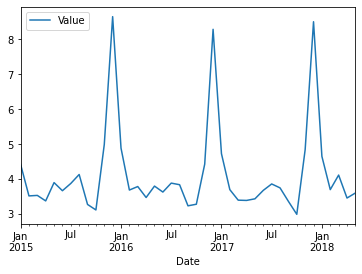

In [12]:
# Explore monthlywise data
df2.resample('M').mean().plot()

From the above plot, I can see there is always a seasonality of trend in every year during Nov, Dec month during Christmas.

In [13]:
# Extracting year, month, day and week, and making new column
df2['Year'] = df2.index.year
df2['Month'] = df2.index.month
df2['Day'] = df2.index.day
df2['WeekOfYear'] = df2.index.weekofyear
df2['Weekday'] = df2.index.weekday
df2.head()

,Value,Year,Month,Day,WeekOfYear,Weekday
Date,,,,,,
2015-01-01 10:00:00,0,2015,1,1,1,3
2015-01-01 10:15:00,1,2015,1,1,1,3
2015-01-01 10:30:00,4,2015,1,1,1,3
2015-01-01 10:45:00,3,2015,1,1,1,3
2015-01-01 11:00:00,1,2015,1,1,1,3


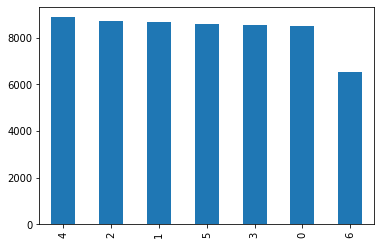

In [14]:
# Checking days when the stores were closed
df2['Weekday'].value_counts().plot(kind='bar');

From the above plot,I have observed that the Shop opened throughtout the week since there was some sales traffic on all days

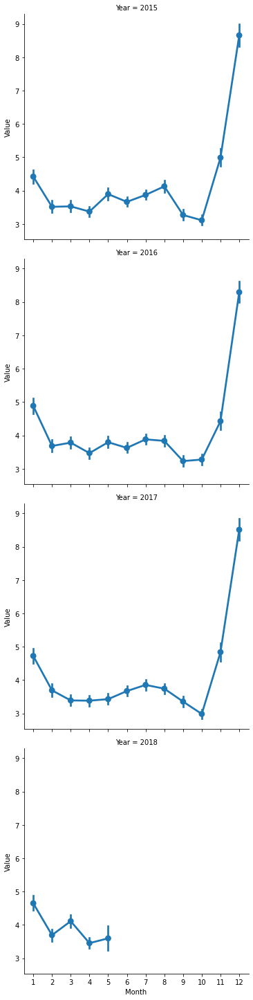

In [15]:
# Sales trend over the months
sns.factorplot(data = df2, x ="Month", y = "Value", row = "Year");

I can see from the above trends that sales tend to spike in November and December due to Christmas Holiday. So, there is a seasonality factor present in the data.

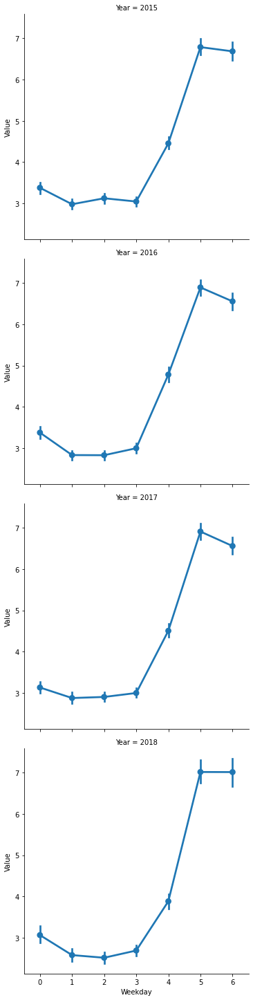

In [16]:
# Traffic trend over weekdays
sns.factorplot(data = df2, x ="Weekday", y = "Value", row = "Year");

I can see that sales traffic tends to increase in weekends( friday, saturday, sunday) compare to weedays

#Conclusion of EDA

1. Customers tends to buy more on Weekends compare to weekdays
2. There is increase in Sales during Novemeber and December months due to Christmas

## B. Time series Analysis & Predictive Modelling

#Stationarity of Time Series
In order to use time series forecasting models, we need to ensure that our time series data is stationary i.e constant mean, constant variance and constant covariance with time.

ADFuller test: This test provides us the statistical data such as p-value to understand whether we can reject the null hypothesis. The null hypothesis is that data is not stationary and the alternative hypothesis says that data is stationary. If p-value is less than the critical value (say 0.5), we will reject the null hypothesis and say that data is stationary.


In [17]:

result = adfuller(df2['Value'])

In [18]:
print(f'Test Statistics: {result[0]}')
print(f'p-value: {result[1]}')
print(f'Critial Values: {result[4]}')

if result[1] > 0.05 :
  print('Series is not Stationary')
else:
  print('Series is Stationary')

Test Statistics: -16.585047778868834
p-value: 1.8198579426816615e-29
Critial Values: {'1%': -3.4304620156823, '5%': -2.861589508787711, '10%': -2.56679635186302}
Series is Stationary


From the above statistical test,I have observed that P value < critical value . So I can conclude that given time series met stationarity requirement( Mean & variance constant over the period of time)

#Predictive Modelling

In [19]:
# US Holiday & National Holiday list
holidays_df = pd.DataFrame([], columns = ['ds','holiday'])

In [20]:
ldates = []
lnames = []
for date, name in sorted(holidays.US(prov='US', years=np.arange(2013, 2018 + 1)).items()):
    ldates.append(date)
    lnames.append(name)

In [21]:
ldates = np.array(ldates)
lnames = np.array(lnames)

In [22]:
holidays_df.loc[:,'ds'] = ldates

In [23]:
holidays_df.loc[:,'holiday'] = lnames

In [24]:
holidays_df.holiday.unique()


array(["New Year's Day", 'Martin Luther King Jr. Day',
       "Washington's Birthday", 'Memorial Day', 'Independence Day',
       'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
       'Christmas Day', 'Independence Day (Observed)',
       'Christmas Day (Observed)', "New Year's Day (Observed)",
       'Veterans Day (Observed)'], dtype=object)

I have conflate the actual holidays and the 'observed' ones to reduce the number of categories

In [25]:
holidays_df.loc[:,'holiday'] = holidays_df.loc[:,'holiday'].apply(lambda x : x.replace(' (Observed)',''))

In [26]:
holidays_df.holiday.unique()

array(["New Year's Day", 'Martin Luther King Jr. Day',
       "Washington's Birthday", 'Memorial Day', 'Independence Day',
       'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
       'Christmas Day'], dtype=object)

In [28]:
# To rename column name to match with Prophet
sale_df = df[['Date', 'Value']].rename({'Date': 'ds',
                                               'Value': 'y'}, axis='columns')

In [29]:
sale_df

,ds,y
0,2015-01-01 10:00:00,0
1,2015-01-01 10:15:00,1
2,2015-01-01 10:30:00,4
3,2015-01-01 10:45:00,3
4,2015-01-01 11:00:00,1
...,...,...
58432,2018-05-06 18:15:00,6
58433,2018-05-06 18:30:00,4
58434,2018-05-06 18:45:00,1
58435,2018-05-06 19:00:00,4


In [30]:
# from year 2013 to 2017 considered for Train data, 
train = sale_df[(sale_df['ds']>= '01/01/2015')&(sale_df['ds']<='2017-12-31')]
test =sale_df[(sale_df['ds']>'2017-12-31')]

In [31]:
print(train.shape)
print(test.shape)

(52433, 2)
(6004, 2)


In [43]:
# Define Prophet Model
model = Prophet(interval_width=0.95, daily_seasonality=True,
                 holidays=holidays_df)

In [44]:
model.fit(train)

In [34]:
model.params

{'beta': array([[ 3.61577305e-02, -2.58983894e-02, -1.44444031e-01,
          4.10731759e-01, -2.37556838e-01,  1.78499742e-01,
         -1.85880384e-01,  1.10759928e-01, -1.22924159e-01,
          1.68304081e-01, -1.32241926e-01,  4.88174006e-02,
         -6.44042208e-02,  8.31264277e-02, -1.43202204e-01,
          1.58624108e-01, -6.73962656e-02,  1.42263576e-01,
         -1.70558574e-01,  8.93259081e-02,  5.34131851e-01,
         -6.83803946e-01, -3.44662339e-01,  1.54898971e-01,
          3.95223755e-02, -7.59550564e-02, -1.01246528e+00,
         -1.00852322e+00,  5.70413014e-01, -1.48303426e-01,
         -1.18270973e-01, -2.58160609e-01,  4.28777545e-02,
         -9.52796159e-03,  2.30364059e+00, -3.37970651e-04,
          6.46220440e-02,  1.82839367e+00,  1.60654897e+00,
          1.60605560e+00, -2.82539911e-01,  4.32990884e-01,
          5.00135774e-01,  1.52400011e+00]]),
 'delta': array([[ 9.20501247e-02,  3.37991920e-03,  1.57349922e-03,
          2.90298407e-04,  3.04905211

In [45]:
future = model.make_future_dataframe(periods=3000, freq='15min')
future.head(10)
future.shape

(55433, 1)

In [46]:
forecast= model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
55428,2018-01-31 03:00:00,-0.946990,-6.298820,4.301001
55429,2018-01-31 03:15:00,-0.803281,-6.268703,4.605244
55430,2018-01-31 03:30:00,-0.680085,-6.100588,4.523620
55431,2018-01-31 03:45:00,-0.580077,-5.721268,4.951945
55432,2018-01-31 04:00:00,-0.505057,-6.051398,5.271814


In [47]:
sale_df1 = pd.concat([sale_df.set_index('ds')['y'], forecast.set_index('ds')['yhat']],axis=1)

In [48]:
sale_df1.head(10)

,y,yhat
ds,,
2015-01-01 10:00:00,0.0,4.417526
2015-01-01 10:15:00,1.0,4.761133
2015-01-01 10:30:00,4.0,5.132539
2015-01-01 10:45:00,3.0,5.525942
2015-01-01 11:00:00,1.0,5.934735
2015-01-01 11:15:00,2.0,6.351689
2015-01-01 11:30:00,5.0,6.769168
2015-01-01 11:45:00,6.0,7.179373
2015-01-01 12:00:00,7.0,7.574590


In [49]:
from fbprophet.plot import plot_plotly
import plotly.offline as py

fig= plot_plotly(model, forecast)
py.iplot(fig)

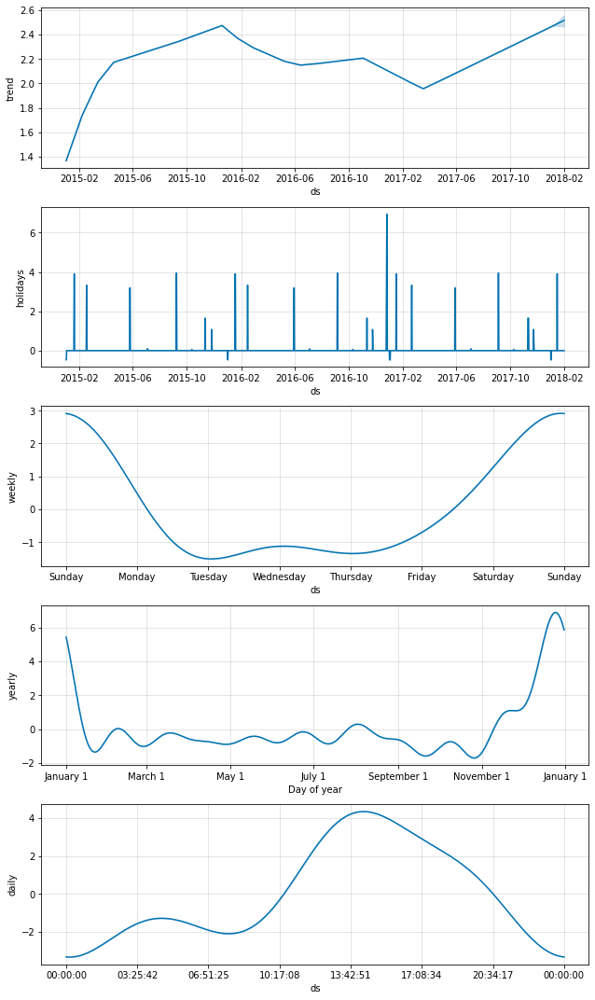

In [50]:
fig1 = model.plot_components(forecast)


1. Based on Daily plot, I have observed that sales traffic is peak between 12PM to 4PM daily

2. From Yearly plot, I can see there is increase in trend during December & January due to christmas holiday & Thanks giving day

3. From Weekly plot, I can see there is increase sales from Thrusday to sunday due weekends.

4. From Trend plot , I have observed that there is seasonality & increase in trend based on Holiday plot.

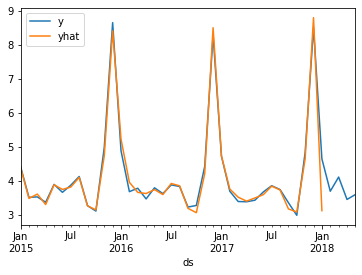

In [56]:
sale_df1['2014':'2018'].resample('M').mean().plot()

From the above trend, it clearly shows that trained model can able to capture all seasonality and trends.

In [149]:
# To find Hourly sales traffic of store
future1 = model.make_future_dataframe(periods=5000, freq='60 min')


In [150]:
forecast_H= model.predict(future1)
forecast_H[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)


,ds,yhat,yhat_lower,yhat_upper
57423,2018-07-26 21:00:00,1.490189,-3.793777,7.128840
57424,2018-07-26 22:00:00,0.230630,-5.604506,5.922690
57425,2018-07-26 23:00:00,-0.748511,-5.898543,4.422641
57426,2018-07-27 00:00:00,-1.138897,-6.341219,4.585137
57427,2018-07-27 01:00:00,-0.879477,-6.846674,4.371183
57428,2018-07-27 02:00:00,-0.188365,-5.175035,5.583844
57429,2018-07-27 03:00:00,0.569923,-5.230731,6.428178
57430,2018-07-27 04:00:00,1.075820,-4.350155,6.225668
57431,2018-07-27 05:00:00,1.188974,-3.972860,6.840542
57432,2018-07-27 06:00:00,0.980429,-4.512098,6.360920


from 

In [172]:
# predictions to unseen data

forecasts5 = pd.DataFrame({'Date': forecast_H['ds'], 
                          'Traffic': forecast_H['yhat']})
# forecasts
#forecasts5['Date'].tail(30)
forecast6 = forecasts5[(forecasts5['Date']>= '05/07/2018') & (forecasts5['Date']<= '06/08/2018')]

forecast6.shape

(769, 2)

In [174]:
forecast6.to_csv("SalesTraffic_forecast.csv", index = False)

In [144]:
sale_df2 = pd.concat([sale_df.set_index('ds')['y'], forecast_H.set_index('ds')['yhat']],axis=1)

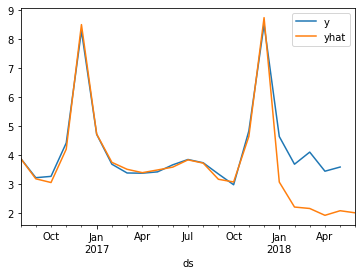

In [148]:
sale_df2['2016-08-06': '2018-06-30'].resample('M').mean().plot()

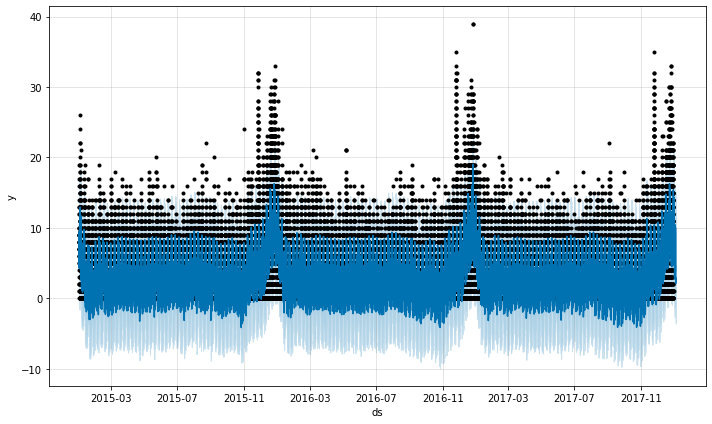

In [117]:
fig1 = model.plot(forecast_H)

## Validation

Here I will do cross-validation to assess prediction performance on a horizon of 180 days, starting with 730 days of training data in the first cutoff and then making predictions every 90 days. This corresponds to 4 total forecasts.

In [126]:
from fbprophet.diagnostics import  cross_validation
cv_results = cross_validation(model= model ,initial='730 days', period='180 days', horizon = '300 days')

INFO:fbprophet:Making 1 forecasts with cutoffs between 2017-03-05 22:00:00 and 2017-03-05 22:00:00


In [127]:
cv_results.head()


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2017-03-06 09:00:00,-0.930615,-6.681632,4.071823,0,2017-03-05 22:00:00
1,2017-03-06 10:15:00,0.327174,-5.286433,5.689085,2,2017-03-05 22:00:00
2,2017-03-06 10:30:00,0.688316,-4.601541,6.033559,2,2017-03-05 22:00:00
3,2017-03-06 10:45:00,1.072206,-4.440348,6.829293,2,2017-03-05 22:00:00
4,2017-03-06 11:00:00,1.471235,-3.694355,6.748331,2,2017-03-05 22:00:00


In [128]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(cv_results)
df_p

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,30 days 20:30:00,4.450619,2.109649,1.691135,0.531506,0.989619
1,30 days 20:45:00,4.450726,2.109674,1.691190,0.531506,0.989619
2,30 days 21:00:00,4.449246,2.109324,1.690595,0.531506,0.989619
3,30 days 21:15:00,4.452029,2.109983,1.691345,0.531506,0.989619
4,30 days 21:30:00,4.452756,2.110155,1.691660,0.531711,0.989619
...,...,...,...,...,...,...
13001,299 days 22:15:00,23.181179,4.814684,3.722481,0.364686,0.808304
13002,299 days 22:30:00,23.231909,4.819949,3.727375,0.364800,0.807612
13003,299 days 22:45:00,23.257310,4.822583,3.730341,0.364800,0.806920
13004,299 days 23:00:00,23.327359,4.829840,3.736592,0.365512,0.806228



Final Prophet model:
Our baseline Prophet model used default parameters and I got RMSE of 2.1 